### 2d_axial_inf.ipynb
#### This is a notebook containing an example of how to run axial range expansion simulations in 2D (infinite sites model).
---
First, include the 2d.jl script to use its functions:

In [1]:
include("../2d.jl")

2d.jl successfully loaded.


For a simpler calculation, it is sometimes viable to simulate a range expansion using the infinite sites model. Simply use the suffix *_inf* for infinite-sites simulations:

In [2]:
test = rangeexp_axial_inf(10,100;data_to_generate="FPSN")

Dict{String, Any} with 7 entries:
  "pops"   => Float32[NaN NaN … NaN NaN; NaN NaN … NaN NaN; … ; NaN NaN … NaN N…
  "meanf"  => Float32[NaN NaN … NaN NaN; NaN NaN … NaN NaN; … ; NaN NaN … NaN N…
  "delneu" => Float32[NaN NaN … NaN NaN; NaN NaN … NaN NaN; … ; NaN NaN … NaN N…
  "bensel" => Float32[NaN NaN … NaN NaN; NaN NaN … NaN NaN; … ; NaN NaN … NaN N…
  "delsel" => Float32[NaN NaN … NaN NaN; NaN NaN … NaN NaN; … ; NaN NaN … NaN N…
  "benneu" => Float32[NaN NaN … NaN NaN; NaN NaN … NaN NaN; … ; NaN NaN … NaN N…
  "stats"  => Dict{String, Any}("y_max_burnin"=>10, "x_max"=>100, "r_prolif_rat…

It is much faster, although it ignores the biallelic structure, hence there is no dominance coefficient. Instead of *n_loci*, it has *n_segr_regions*; and instead of *n_sel_loci*, it has *prop_of_sel_loci*:

In [3]:
test["stats"]

Dict{String, Any} with 20 entries:
  "y_max_burnin"      => 10
  "x_max"             => 100
  "r_prolif_rate"     => 1.8
  "name"              => "2024-06-21_05-57-14"
  "s_sel_coef"        => 0.002
  "prop_of_sel_loci"  => 1.0
  "n_gens_burnin"     => 10
  "x_max_burnin"      => 5
  "k_capacity"        => 20
  "y_max"             => 10
  "prop_of_del_muts"  => 0.9
  "migr_rate"         => 0.1
  "n_segr_regions"    => 20
  "y_startfill"       => 10
  "n_gens"            => 110
  "x_startfill"       => 5
  "migr_mode"         => "4"
  "n_gens_exp"        => 100
  "mut_rate"          => 0.7567
  "n_demes_startfill" => 5

┌ Info: Saved animation to C:\Users\Hartree\AppData\Local\Temp\jl_HiZyfiNmZo.gif
└ @ Plots C:\Users\Hartree\.julia\packages\Plots\ju9dp\src\animation.jl:156


Plots.AnimatedGif("C:\\Users\\Hartree\\AppData\\Local\\Temp\\jl_HiZyfiNmZo.gif")
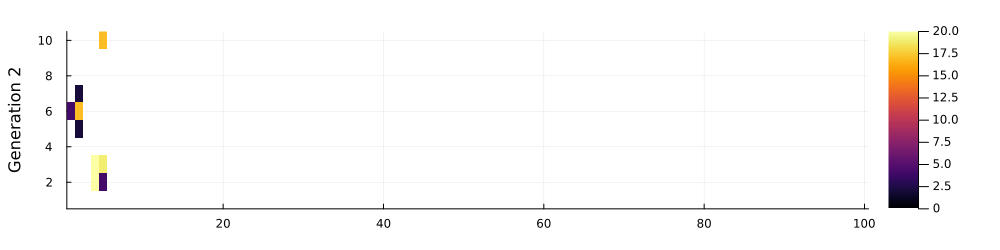

In [4]:
re_heatmap_pops(test)

┌ Info: Saved animation to C:\Users\Hartree\AppData\Local\Temp\jl_1er8jAFUpW.gif
└ @ Plots C:\Users\Hartree\.julia\packages\Plots\ju9dp\src\animation.jl:156


Plots.AnimatedGif("C:\\Users\\Hartree\\AppData\\Local\\Temp\\jl_1er8jAFUpW.gif")
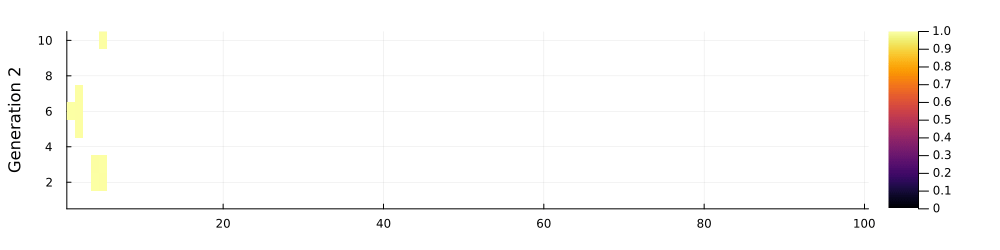

In [5]:
re_heatmap_meanf(test)

One type of data output is the number of new selected deleterious mutations per deme in that generation:

┌ Info: Saved animation to C:\Users\Hartree\AppData\Local\Temp\jl_Hqxw5OVi3o.gif
└ @ Plots C:\Users\Hartree\.julia\packages\Plots\ju9dp\src\animation.jl:156


Plots.AnimatedGif("C:\\Users\\Hartree\\AppData\\Local\\Temp\\jl_Hqxw5OVi3o.gif")
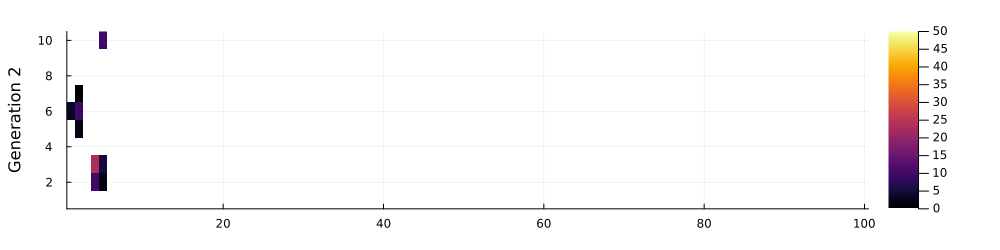

In [6]:
re_heatmap_delsel(test)

The individuals have all their segregating regions selected, by default. But we can change that by setting the *prop_of_sel_loci* parameter to anything other than 1:

In [22]:
test = rangeexp_axial_inf(100,400;data_to_generate="FPSN",prop_of_sel_loci=0.5)

Dict{String, Any} with 7 entries:
  "pops"   => Float32[NaN NaN … NaN 25.0; 22.0 NaN … NaN NaN; … ; NaN NaN … NaN…
  "meanf"  => Float32[NaN NaN … NaN 1.0; 1.0 NaN … NaN NaN; … ; NaN NaN … NaN N…
  "delneu" => Float32[NaN NaN … NaN 10.0; 6.0 NaN … NaN NaN; … ; NaN NaN … NaN …
  "bensel" => Float32[NaN NaN … NaN 3.0; 2.0 NaN … NaN NaN; … ; NaN NaN … NaN N…
  "delsel" => Float32[NaN NaN … NaN 11.0; 8.0 NaN … NaN NaN; … ; NaN NaN … NaN …
  "benneu" => Float32[NaN NaN … NaN 0.0; 1.0 NaN … NaN NaN; … ; NaN NaN … NaN N…
  "stats"  => Dict{String, Any}("y_max_burnin"=>10, "x_max"=>100, "r_prolif_rat…

Now we should be able to see neutral region mutations too:

┌ Info: Saved animation to C:\Users\Hartree\AppData\Local\Temp\jl_D8tg5ePWJg.gif
└ @ Plots C:\Users\Hartree\.julia\packages\Plots\ju9dp\src\animation.jl:156


Plots.AnimatedGif("C:\\Users\\Hartree\\AppData\\Local\\Temp\\jl_D8tg5ePWJg.gif")
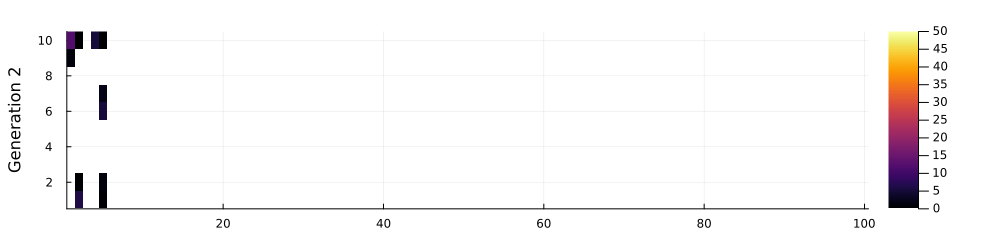

In [23]:
re_heatmap_delneu(test)

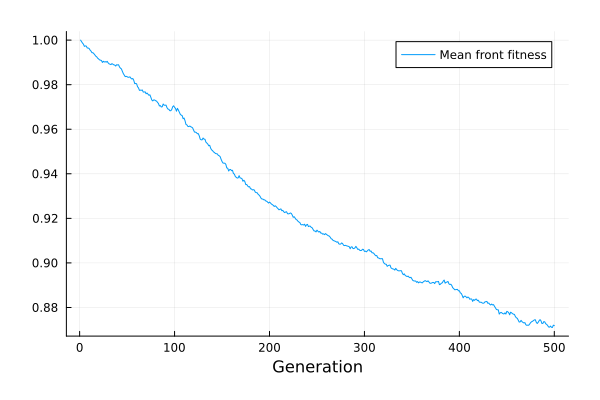

In [24]:
test_meanf_frontav = average_front(test,"meanf")
plot(test_meanf_frontav,xlabel="Generation",label="Mean front fitness")

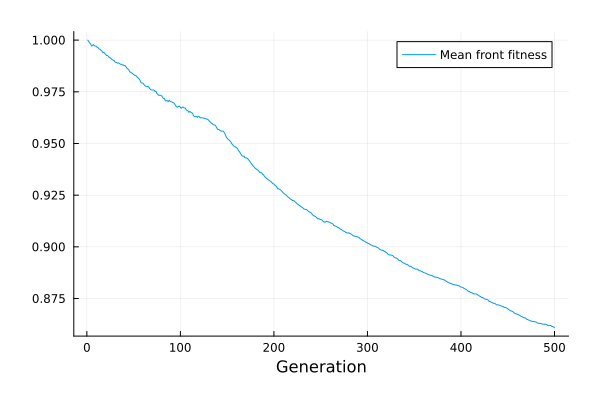

In [25]:
test_meanf_av = average_all(test,"meanf")
plot(test_meanf_av,xlabel="Generation",label="Mean front fitness")

┌ Info: Saved animation to C:\Users\Hartree\AppData\Local\Temp\jl_rY5IZ0TQ3O.gif
└ @ Plots C:\Users\Hartree\.julia\packages\Plots\ju9dp\src\animation.jl:156


Plots.AnimatedGif("C:\\Users\\Hartree\\AppData\\Local\\Temp\\jl_rY5IZ0TQ3O.gif")
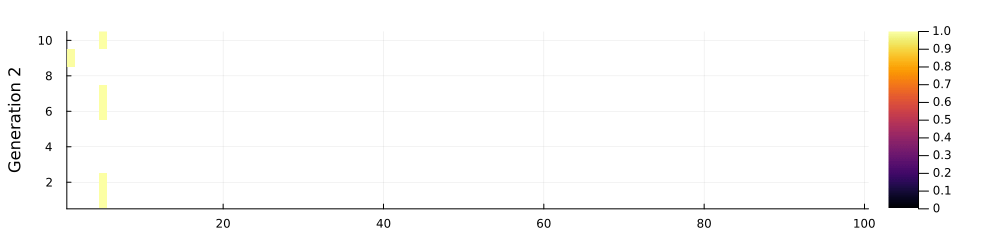

In [26]:
test_meanf_frontarr = front_array(test,"meanf";oneside=true)
re_heatmap_meanf(test_meanf_frontarr,1,test["stats"]["n_gens"])

┌ Info: Saved animation to C:\Users\Hartree\AppData\Local\Temp\jl_FCFQPGvwvE.gif
└ @ Plots C:\Users\Hartree\.julia\packages\Plots\ju9dp\src\animation.jl:156


Plots.AnimatedGif("C:\\Users\\Hartree\\AppData\\Local\\Temp\\jl_FCFQPGvwvE.gif")
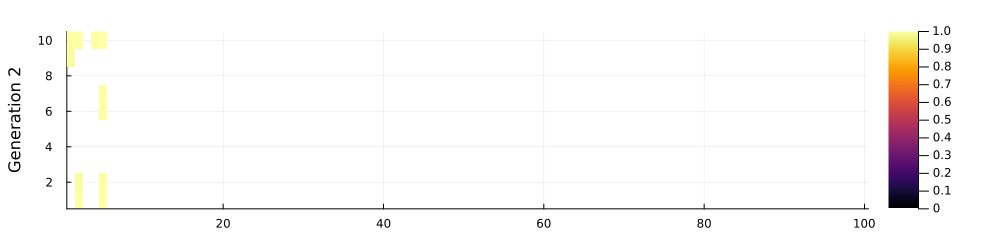

In [27]:
re_heatmap_meanf(test)